# Purpose
- Prediction on time series dataset ("CalIt2 Building People Counts Data Set")
- Detect anomalies
- Detect events hours
- Develop yourself with multivariate data

In [1]:
import pandas as pd
import numpy as np
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
import holidays
import seaborn as sns
import pandas_profiling
import plotly.offline as py
import plotly.graph_objs as go
import prophet_prediction as prp
py.init_notebook_mode()

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

encoding = "utf-8-sig"

In [2]:
# Reading Data
df_orig = read_csv('CalIt2.data', header=None, squeeze=True, names = ["flow_id", "date", "time", "count"])
df = df_orig.copy()
df_orig.head(2)


,flow_id,date,time,count
0,7,07/24/05,00:00:00,0
1,9,07/24/05,00:00:00,0


In [3]:
# extract datetime
date_time = pd.to_datetime(df['date'] + ' ' + df['time'])
# drop date and time to merge as datetime
df.drop('date', axis=1, inplace=True)
df.drop('time', axis=1, inplace=True)

df = pd.concat([df, date_time], axis=1)
df.columns = ['flow_id', 'count', 'datetime']
df.head()

,flow_id,count,datetime
0,7,0,2005-07-24 00:00:00
1,9,0,2005-07-24 00:00:00
2,7,1,2005-07-24 00:30:00
3,9,0,2005-07-24 00:30:00
4,7,0,2005-07-24 01:00:00


In [4]:
pandas_profiling.ProfileReport(df)

Number of variables,3
Number of observations,10080
Total Missing (%),0.0%
Total size in memory,236.3 KiB
Average record size in memory,24.0 B
Numeric,1
Categorical,0
Boolean,1
Date,1
Text (Unique),0
Rejected,0


# Comments
 > - people counter data between the 24/07/2005 - 05/11-2005 (4months). So there is no seaonality information on data. <br/>
 > - 'counts' data has '0' values %50 frequently<br/>
 > - max value of 'count':62. Most of the values between 0-10. Look at the above profiler code: Variables -> Count -> Histogram <br/>
 > - No missing data

# Prepare dataframes
> 'df_in'     --> incoming people at main door <br/>
> 'df_out'    --> outgoing people at main door <br/>
> 'df_dif'    --> incoming - outgoing people at main door <br/>
> 'df_in_out' --> incoming and outgoing people as separete columns <br/>

In [5]:
df_in = df.loc[df['flow_id'] == 9]
df_out = df.loc[df['flow_id'] == 7]
df_in.drop('flow_id', inplace=True, axis=1)
df_in.set_index('datetime', inplace=True)
df_out.drop('flow_id', inplace=True, axis=1)
df_out.set_index('datetime', inplace=True)
df_dif = pd.concat([df_in['count'] - df_out['count']], axis=1)
df_in_out = pd.concat([df_in['count'], df_out['count']], axis=1)
df_in_out.columns= ["count_in", "count_out"]

/Users/obss/anaconda3/envs/main/lib/python3.7/site-packages/pandas/core/frame.py:3940: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [6]:
print('df_in')
print(df_in.head(2))
print("--------")
print('df_out')
print(df_out.head(2))
print("--------")
print('df_dif')
print(df_dif.head(2))
print("--------")
print('df_in_out')
print(df_in_out.head(2))

df_in
                     count
datetime                  
2005-07-24 00:00:00      0
2005-07-24 00:30:00      0
--------
df_out
                     count
datetime                  
2005-07-24 00:00:00      0
2005-07-24 00:30:00      1
--------
df_dif
                     count
datetime                  
2005-07-24 00:00:00      0
2005-07-24 00:30:00     -1
--------
df_in_out
                     count_in  count_out
datetime                                
2005-07-24 00:00:00         0          0
2005-07-24 00:30:00         0          1


# Profiling 'df_in_out'

In [7]:
pandas_profiling.ProfileReport(df_in_out)

Number of variables,3
Number of observations,5040
Total Missing (%),0.0%
Total size in memory,118.2 KiB
Average record size in memory,24.0 B
Numeric,2
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,0


# Analyze Trend: Showing Yearly, Montly, Daily Trending times for:
> - 'df_in' <br/> 
> - 'df_out' <br/>  
> - 'df_dif' <br/>

## 'df_in'

In [8]:
forecast_in, m_in = prp.prophet_predict(df_in)
mae_in = prp.forecast_mae(forecast_in)
print(mae_in)

/Users/obss/anaconda3/envs/main/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



3.2118954913952686


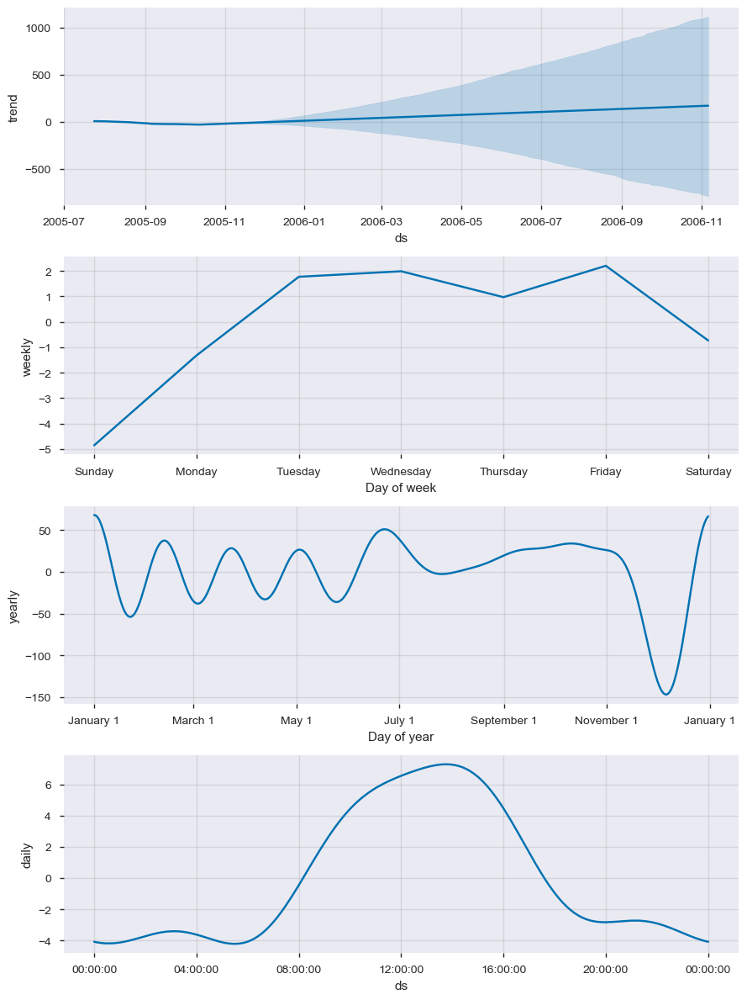

In [9]:
# Plot Trend
fig = m_in.plot_components(forecast_in) # Plot

In [10]:
# Plot Forecast
prp.plot_forecast_ts(forecast_in) # Plot

##  'df_out'

In [11]:
forecast_out, m_out = prp.prophet_predict(df_out)
mae_out = prp.forecast_mae(forecast_out)
print(mae_out)

/Users/obss/anaconda3/envs/main/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



2.868997942412955


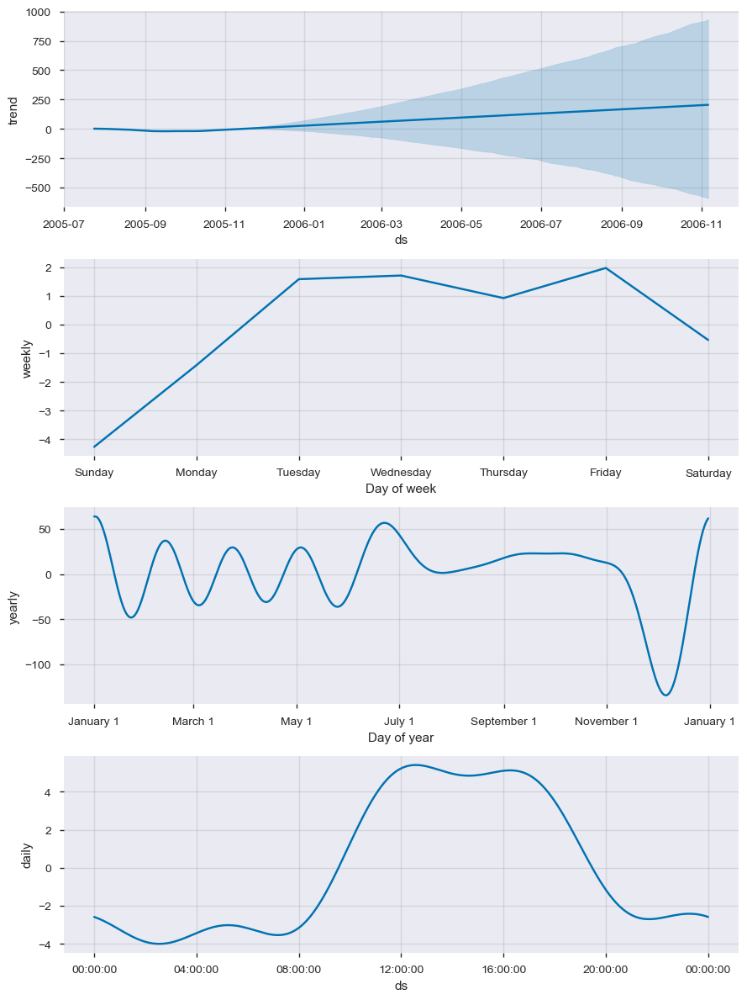

In [12]:
# Plot Trend
fig = m_out.plot_components(forecast_out) # Plot

In [13]:
# Plot Forecast
prp.plot_forecast_ts(forecast_out) # Plot

##  'df_dif'

In [14]:
forecast_dif, m_dif = prp.prophet_predict(df_dif)
mae_dif = prp.forecast_mae(forecast_dif)
print(mae_dif)

/Users/obss/anaconda3/envs/main/lib/python3.7/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



2.583145907556504


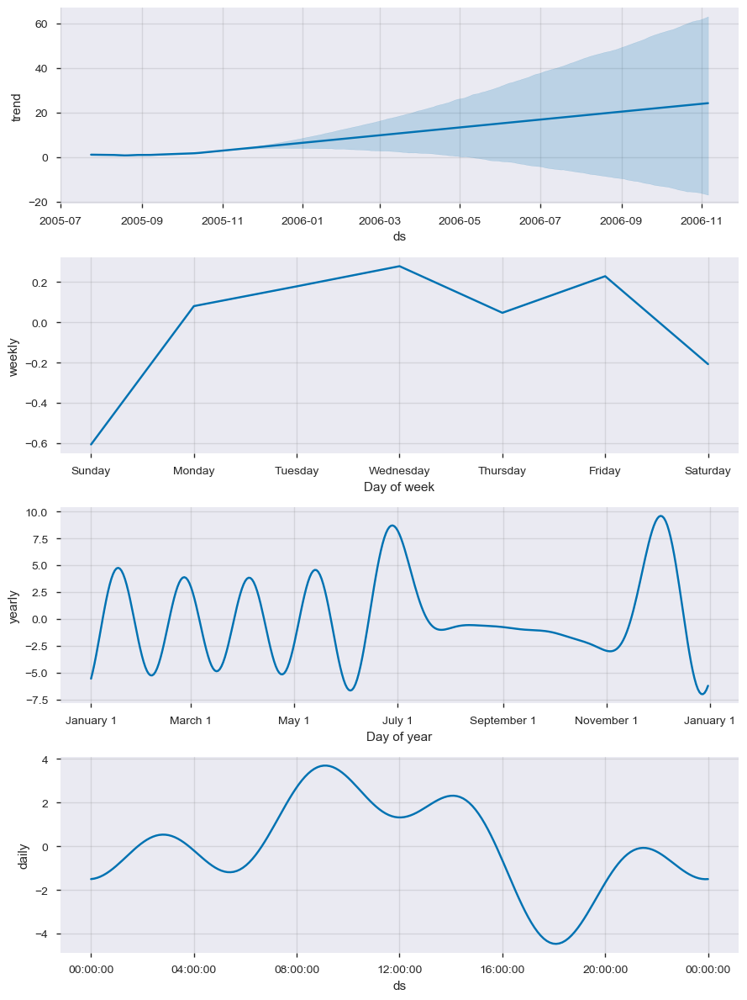

In [15]:
# Plot Trend
fig = m_dif.plot_components(forecast_dif) # Plot

In [16]:
# Plot Forecast
prp.plot_forecast_ts(forecast_dif) # Plot

# Correlation beetwen incoming and outgoing counter

,count_in,count_out
count_in,1.000000,0.726077
count_out,0.726077,1.000000


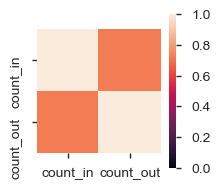

In [17]:
corrmat_in_out = df_in_out.corr().abs()
f, axes = pyplot.subplots(1, 1, figsize=(2, 2))
sns.heatmap(corrmat_in_out, vmax=1, vmin=0, square=True,ax=axes)
corrmat_in_out

In [18]:
corrmat_in_out

,count_in,count_out
count_in,1.000000,0.726077
count_out,0.726077,1.000000


# Regression

In [19]:
df_in_regression = df_in.copy()
df_out_regression = df_out.copy()

In [20]:
from datetime import datetime
def make_categorical_hour(hour):
    if hour < 4:
        return "1"
    elif hour < 8:
        return "2"
    elif hour < 12:
        return "3"
    elif hour < 16:
        return "4"
    elif hour < 20:
        return "5"
    elif hour < 22:
        return "6"
    elif hour < 25:
        return "1"

def add_date_feature(df, df_date):
    df['dayofweek'] = df_date.dt.dayofweek.astype(int)
    df['hour'] = df_date.dt.hour.astype(int).map(make_categorical_hour)
    us_holidays = holidays.UnitedStates(prov=None, state='CA')
    df['isholiday'] = [x in us_holidays for x in df_date[date_time.index]]

In [21]:
temp = df_orig.loc[df_orig['flow_id'] == 9]
date_time = pd.to_datetime(temp['date'] + ' ' + temp['time'])
date_time.index = date_time

In [22]:
add_date_feature(df_in_regression, date_time)
add_date_feature(df_out_regression, date_time)

In [23]:
df_in_regression.sample(2)

,count,dayofweek,hour,isholiday
datetime,,,,
2005-10-18 01:30:00,0,1,1,False
2005-11-04 14:00:00,20,4,4,False


In [24]:
df_out_regression.sample(2)

,count,dayofweek,hour,isholiday
datetime,,,,
2005-09-13 09:00:00,2,1,3,False
2005-08-12 18:00:00,6,4,5,False


In [25]:
from sklearn.model_selection import KFold 
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import r2_score, explained_variance_score,           \
                            mean_squared_error, mean_absolute_error,      \
                            mean_squared_log_error, median_absolute_error

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import linear_model
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Perceptron

from statsmodels.tsa.arima_model import ARIMA

/Users/obss/anaconda3/envs/main/lib/python3.7/site-packages/lightgbm/__init__.py:46: UserWarning:

Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.



In [26]:
#import pdb

In [27]:
def forecast_cross_validation(df_data, y_name='count'): 
    
    
    y = df_data[y_name]
    X = df_data.drop(y_name, axis=1)

    kf     = KFold(n_splits=7, shuffle=True) # Define the split
    Xv     = X.values
    yv     = y.values
    preds  = []
    scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = Xv[train_index], Xv[test_index]
        y_train, y_test = yv[train_index], yv[test_index]

        
        pipline_model = Pipeline([
              ('feature_selection', SelectFromModel(XGBRegressor(), threshold='0.2*mean')),
              ('classification', XGBRegressor())
            ])
        
        # Ensemble 
        xgb      = XGBRegressor()
        rf       = RandomForestRegressor(n_estimators=30)
        lgbm     = LGBMRegressor()
        
        #Linear Models
        reg        = linear_model.LinearRegression()
        ridge      = linear_model.Ridge(alpha=0.5)
        lasso      = linear_model.Lasso(alpha=0.1)
        elasticNet = linear_model.ElasticNet()
        omp        = linear_model.OrthogonalMatchingPursuit()
        sgd        = linear_model.SGDRegressor()
        polyReg3   = Pipeline([('poly', PolynomialFeatures(degree=2)),
                               ('feature_selection', SelectFromModel(LinearRegression(fit_intercept=False))),
                               ('linear', LinearRegression(fit_intercept=False))])

        models = [pipline_model, reg, ridge, lasso, elasticNet, omp, sgd, polyReg3, lgbm, rf, xgb]

        pred_df  = pd.DataFrame()
        score_df = pd.DataFrame()
        for model in models:

            model.fit(X_train, y_train)
            y_pred = model.predict(X_test)

            pred_df[type(model).__name__] = y_pred
            #pdb.set_trace()
            score_df.at[type(model).__name__, "r2"]  = r2_score(y_test, y_pred)
            score_df.at[type(model).__name__, "rmse"] = np.sqrt(mean_squared_error(y_test, y_pred))
            score_df.at[type(model).__name__, "mse"] = mean_squared_error(y_test, y_pred)
            score_df.at[type(model).__name__, "mae"] = mean_absolute_error(y_test, y_pred)
            score_df.at[type(model).__name__, "exp_var"]  = explained_variance_score(y_test, y_pred)
            score_df.at[type(model).__name__, "medae_cv"] = median_absolute_error(y_test, y_pred)

        scores.append(score_df)
        preds.append(pred_df)

    n_splits = kf.get_n_splits(X)

    #average the splits
    scores_average = scores[0]/n_splits
    for i in range(1,n_splits):
        scores_average =scores_average.add(scores[i]/n_splits, fill_value=0)
    scores_average.applymap(lambda x:'{0:.3f}'.format(x))
    return scores_average.sort_values(by=['r2'])

In [28]:
forecast_cross_validation(df_in_regression)

[01:18:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

,r2,rmse,mse,mae,exp_var,medae_cv
OrthogonalMatchingPursuit,0.059918,6.613730,43.924189,4.632488,0.060444,3.064786
Pipeline,0.066621,6.590523,43.625951,4.613018,0.066905,2.827569
ElasticNet,0.122321,6.390639,41.015589,4.409599,0.122731,3.205706
SGDRegressor,0.130492,6.360441,40.624359,4.264955,0.134473,2.938145
Lasso,0.131782,6.355998,40.573089,4.304199,0.132146,3.200668
LinearRegression,0.136801,6.337438,40.335867,4.278628,0.137227,3.090232
Ridge,0.136804,6.337428,40.335767,4.278733,0.137230,3.090429
XGBRegressor,0.584654,4.401601,19.694644,2.238905,0.585241,0.609602
RandomForestRegressor,0.586225,4.392737,19.612968,2.224884,0.586740,0.656244
LGBMRegressor,0.586710,4.390178,19.591716,2.230744,0.587237,0.662101


In [29]:
forecast_cross_validation(df_out_regression)

[01:18:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:47] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:48] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[01:18:49] WARNING: src/objective/regression_obj.cu:152: reg:linear is n

,r2,rmse,mse,mae,exp_var,medae_cv
OrthogonalMatchingPursuit,0.137559,5.576764,31.149365,3.768479,0.138156,2.297099
Pipeline,0.137559,5.576764,31.149365,3.768479,0.138156,2.297099
ElasticNet,0.190797,5.402474,29.240534,3.652568,0.191391,2.655128
Lasso,0.204816,5.355388,28.734190,3.599113,0.205495,2.507605
SGDRegressor,0.207238,5.347171,28.645309,3.577462,0.208520,2.435060
LinearRegression,0.209418,5.339806,28.565849,3.591109,0.210214,2.512954
Ridge,0.209424,5.339787,28.565668,3.591014,0.210220,2.512361
RandomForestRegressor,0.534836,4.092159,16.850893,2.241143,0.535702,0.798571
LGBMRegressor,0.534906,4.091477,16.847957,2.239948,0.535745,0.792429
XGBRegressor,0.535339,4.090155,16.839469,2.241840,0.536178,0.883972


# ARIMA

In [32]:
df_in.head(2)

,count
datetime,
2005-07-24 00:00:00,0
2005-07-24 00:30:00,0


In [33]:
df_out.head(2)

,count
datetime,
2005-07-24 00:00:00,0
2005-07-24 00:30:00,1


In [39]:
df_diff = pd.concat([df_in_out['count_in'] - df_in_out['count_out'] ], axis=1)
df_diff.columns = ["count"]
df_diff.head(3)

,count
datetime,
2005-07-24 00:00:00,0
2005-07-24 00:30:00,-1
2005-07-24 01:00:00,0


In [52]:
from statsmodels.tsa.arima_model import ARIMA 
from tqdm import tqdm
def arima_forecast(df):
    X = df.astype('float64').values
    size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    for t in tqdm(range(len(test))):
        model = ARIMA(history, order=(5,1,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
    
    error = mean_squared_error(test, predictions)
    print('Test MSE: %.3f' % error)
    pyplot.plot(test, color='blue')
    pyplot.plot(predictions, color='yellow')
    pyplot.show()

100%|██████████| 1714/1714 [04:06<00:00,  6.21it/s]


Test MSE: 21.312


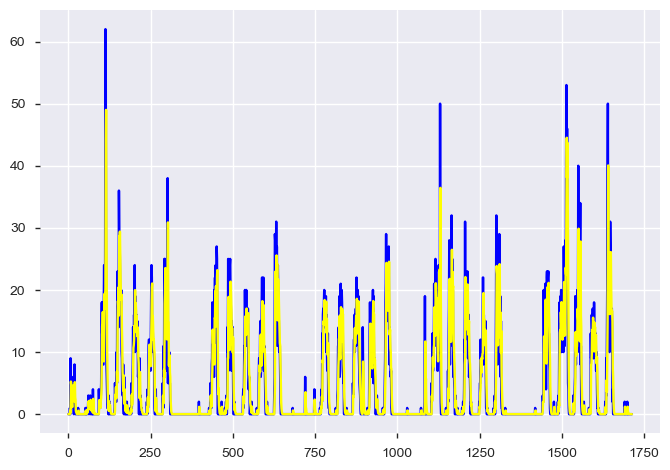

In [53]:
arima_forecast(df_in)

100%|██████████| 1714/1714 [04:15<00:00,  6.44it/s]


Test MSE: 20.029


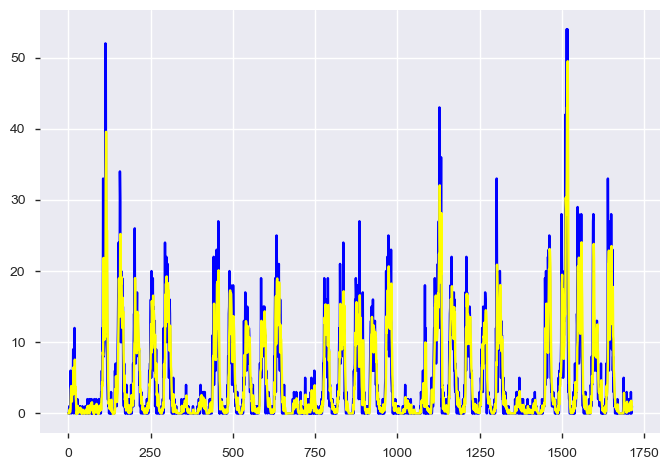

In [54]:
arima_forecast(df_out)

100%|██████████| 1714/1714 [04:41<00:00,  5.66it/s]


Test MSE: 28.085


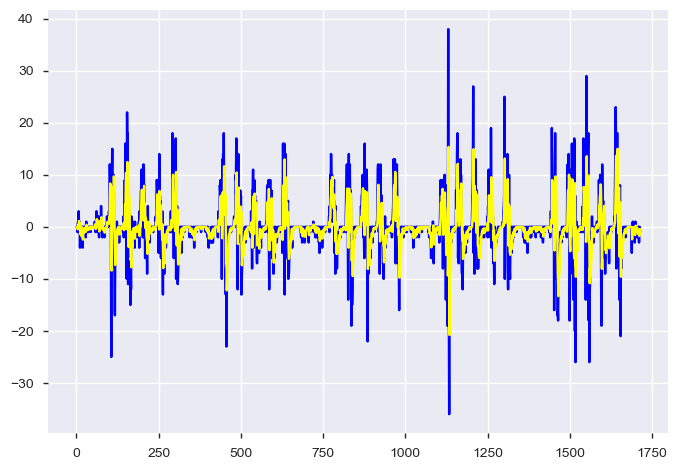

In [55]:
arima_forecast(df_diff)

# TODOS

 - In regression:
> - add before days (Shifting)
> - Add prophet trend informations
> - substract incoming people and outgoing people for predictions and look at error
> - determine anomalies corresponding to predictions. If error is high there may be anomaly

 - IN Arıma can be seen the anomalies with graphic
 - Try LSTM
 - In General:
> - Research..
> - Entegrate with the 'events' data: build a pipeline to find event start and end hours. 
> - Combine all of the informations

In [30]:
#from keras.models import Sequential
#from keras.layers import LSTM
#from keras.layers import Dense
## create and fit the LSTM network
#lstm = Sequential()
#lstm.add(LSTM(30))
#lstm.add(Dense(2))
#lstm.compile(loss='mean_squared_error', optimizer='adam')